In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

In [ ]:
BASE_DIR = "/content/drive/MyDrive/ML PROJECT"  # <- change only if folder name differs
IMAGE_DIR = BASE_DIR  # since disease folders are directly inside "ML PROJECT"
CSV_PATH = os.path.join(BASE_DIR, "Final_dataset.xlsx")

In [ ]:
print("Base folder:", BASE_DIR)
print("Labels file:", CSV_PATH)


Base folder: /content/drive/MyDrive/ML PROJECT
Labels file: /content/drive/MyDrive/ML PROJECT/Final_dataset.xlsx


In [ ]:
import pandas as pd

In [ ]:
# Load your Excel file
df = pd.read_excel("/content/drive/MyDrive/ML PROJECT/Final_dataset.xlsx")

In [ ]:
# Try to detect correct image ID column automatically
possible_id_cols = [
    c for c in df.columns
    if ("image" in c.lower()) or ("file" in c.lower()) or ("id" in c.lower())
]

In [ ]:
if len(possible_id_cols) > 0:
    id_col = possible_id_cols[0]
    print(f"Auto-detected image column: {id_col}")

# If NOT found → ask user to choose manually
else:
    print(" No image column found automatically.")
    print(" Available columns are:", df.columns.tolist())
    id_col = input(" Please type the correct image column name:  ")

# Finally select label columns
# Ignore the 'disease_risk' column
label_cols = [
    c for c in df.columns
    if (c not in [id_col, "image_path"]) and ("risk" not in c.lower())
]

print("\nFINAL RESULTS:")
print(" Image column =", id_col)
print("Label columns =", label_cols)

Auto-detected image column: ID

FINAL RESULTS:
 Image column = ID
Label columns = ['Diabetic Retinopathy', 'Macular Hole', 'Optic Disk Cupping', 'Tessellated Fundus', 'Diabetic Neuropathy', 'Myopia', 'Age Related Macular Degeneration', 'Branch Retinal Vein Occlusion', 'Optic Disk Pit', 'Optic Disk Edema']


In [ ]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split

In [ ]:
BASE_DIR = "/content/drive/MyDrive/ML PROJECT"
CSV_PATH = os.path.join(BASE_DIR, "Final_dataset.xlsx")

print("Base dir:", BASE_DIR)
print("CSV path:", CSV_PATH)

Base dir: /content/drive/MyDrive/ML PROJECT
CSV path: /content/drive/MyDrive/ML PROJECT/Final_dataset.xlsx


In [ ]:
df = pd.read_excel(CSV_PATH)
print("Columns in Excel:", df.columns.tolist())
print("First 5 rows:")
print(df.head())

Columns in Excel: ['ID', 'Disease_Risk', 'Diabetic Retinopathy', 'Macular Hole', 'Optic Disk Cupping', 'Tessellated Fundus', 'Diabetic Neuropathy', 'Myopia', 'Age Related Macular Degeneration', 'Branch Retinal Vein Occlusion', 'Optic Disk Pit', 'Optic Disk Edema']
First 5 rows:
    ID  Disease_Risk  Diabetic Retinopathy  Macular Hole  Optic Disk Cupping  \
0  1.0           1.0                     1             0                   0   
1  2.0           1.0                     1             0                   0   
2  3.0           1.0                     1             0                   0   
3  4.0           1.0                     0             1                   1   
4  5.0           1.0                     1             0                   0   

   Tessellated Fundus  Diabetic Neuropathy  Myopia  \
0                   0                    0       0   
1                   0                    0       0   
2                   0                    0       0   
3                   0   

In [ ]:
possible_id_cols = [
    c for c in df.columns
    if ("image" in c.lower()) or ("file" in c.lower()) or ("id" in c.lower())
]

if len(possible_id_cols) > 0:
    id_col = possible_id_cols[0]
    print(f"\nUsing detected image ID column: {id_col}")
else:
    id_col = df.columns[0]
    print(f"\nNo obvious image column found, temporarily using first column: {id_col}")
    print("If this is wrong, set id_col = 'YOUR_COLUMN_NAME' manually above.")

# All other columns are labels
label_cols = [c for c in df.columns if c != id_col]
print("\nLabel columns:", label_cols)

print("\nSample values from image ID column:")
print(df[id_col].head())


Using detected image ID column: ID

Label columns: ['Disease_Risk', 'Diabetic Retinopathy', 'Macular Hole', 'Optic Disk Cupping', 'Tessellated Fundus', 'Diabetic Neuropathy', 'Myopia', 'Age Related Macular Degeneration', 'Branch Retinal Vein Occlusion', 'Optic Disk Pit', 'Optic Disk Edema']

Sample values from image ID column:
0    1.0
1    2.0
2    3.0
3    4.0
4    5.0
Name: ID, dtype: float64


In [ ]:
image_files = {}
for root, dirs, files in os.walk(BASE_DIR):
    for fname in files:
        if fname.lower().endswith((".jpg", ".jpeg", ".png", ".tif", ".tiff", ".bmp")):
            full_path = os.path.join(root, fname)
            stem = os.path.splitext(fname)[0]
            image_files[fname] = full_path
            image_files[stem] = full_path

print(f"\nTotal image entries indexed: {len(image_files)}")


Total image entries indexed: 2216


In [ ]:
def get_image_path(img_id):
    if pd.isna(img_id):
        return None

    key_raw = str(img_id).strip()
    key_no_space = key_raw.replace(" ", "")

    for k in [key_raw, key_no_space]:
        if k in image_files:
            return image_files[k]
        for ext in [".jpg", ".jpeg", ".png", ".tif", ".bmp"]:
            if k + ext in image_files:
                return image_files[k + ext]

    try:
        num = int(float(img_id))
        cand_list = [
            str(num),
            f"{num}.jpg",
            f"{num}.jpeg",
            f"{num}.png",
            f"{num}.tif",
            f"{num}.bmp",
            f"{num:04d}",
            f"{num:04d}.jpg",
            f"{num:04d}.jpeg",
            f"{num:04d}.png",
        ]
        for cand in cand_list:
            if cand in image_files:
                return image_files[cand]
    except Exception:
        pass

    return None

df["image_path"] = df[id_col].apply(get_image_path)

missing = df["image_path"].isna().sum()
print(f"\nRows with missing image_path: {missing}")

print("\nSample rows with image_path:")
print(df[[id_col, "image_path"]].head(10))

df = df.dropna(subset=["image_path"]).reset_index(drop=True)
print("\nRows remaining after dropping missing images:", len(df))

if len(df) == 0:
    raise RuntimeError(
        "No rows left after mapping image paths. "
        "This means the IDs in the Excel file do NOT match any filenames. "
        "Check that the ID column really contains image names/IDs."
    )

label_cols = [c for c in df.columns if c not in [id_col, "image_path"]]
print("Final label columns:", label_cols)


Rows with missing image_path: 813

Sample rows with image_path:
     ID                                         image_path
0   1.0  /content/drive/MyDrive/ML PROJECT/Diabetic Ret...
1   2.0  /content/drive/MyDrive/ML PROJECT/Diabetic Ret...
2   3.0                                               None
3   4.0  /content/drive/MyDrive/ML PROJECT/Macular Hole...
4   5.0                                               None
5   6.0     /content/drive/MyDrive/ML PROJECT/Myopia/6.png
6   7.0     /content/drive/MyDrive/ML PROJECT/Myopia/7.png
7   8.0     /content/drive/MyDrive/ML PROJECT/Myopia/8.png
8   9.0                                               None
9  10.0                                               None

Rows remaining after dropping missing images: 1108
Final label columns: ['Disease_Risk', 'Diabetic Retinopathy', 'Macular Hole', 'Optic Disk Cupping', 'Tessellated Fundus', 'Diabetic Neuropathy', 'Myopia', 'Age Related Macular Degeneration', 'Branch Retinal Vein Occlusion', 'Optic Dis

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    df["image_path"].values,
    df[label_cols].values,
    test_size=0.2,
    random_state=42
)

print("\nSplit completed")
print("Train size:", len(X_train))
print("Val size:", len(X_val))


Split completed
Train size: 886
Val size: 222


In [ ]:
import tensorflow as tf

# InceptionResNetV2 expects 299x299
IMG_SIZE = (299, 299)
BATCH_SIZE = 16

def load_and_preprocess(path, labels):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32) / 255.0
    return img, labels

def create_dataset(paths, labels, augment=False):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    if augment:
        ds = ds.map(lambda x, y: (tf.image.random_flip_left_right(x), y))
    return ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

train_ds = create_dataset(X_train, y_train, augment=True)
val_ds   = create_dataset(X_val, y_val)

In [ ]:
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
from tensorflow.keras import layers, models

base_model = InceptionResNetV2(
    include_top=False,
    weights='imagenet',
    input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)
)
base_model.trainable = False  # freeze backbone initially

inputs = layers.Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
# our pipeline gives [0,1], InceptionResNetV2 expects ImageNet-preprocessed input
x = preprocess_input(inputs * 255.0)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(len(label_cols), activation='sigmoid')(x)
model = models.Model(inputs, outputs)
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss='binary_crossentropy',
    metrics=[tf.keras.metrics.AUC(multi_label=True)]
)

model.summary()

219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 299, 299, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ multiply (Multiply)             │ (None, 299, 299, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 299, 299, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 299, 299, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_resnet_v2             │ (None, 8, 8, 1536)     │    54,336,736 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       393,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 11)             │         2,827 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 54,733,035 (208.79 MB)

 Trainable params: 396,299 (1.51 MB)

 Non-trainable params: 54,336,736 (207.28 MB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20,
    callbacks=[
        EarlyStopping(monitor='val_auc', patience=4, restore_best_weights=True, mode='max'),
        ReduceLROnPlateau(monitor='val_auc', factor=0.3, patience=2, mode='max'),
        ModelCheckpoint("best_model.h5", save_best_only=True, monitor='val_auc', mode='max')
    ]
)


Epoch 1/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - auc: 0.4708 - loss: 0.4507

56/56 ━━━━━━━━━━━━━━━━━━━━ 373s 6s/step - auc: 0.4707 - loss: 0.4496 - val_auc: 0.5668 - val_loss: 0.3155 - learning_rate: 1.0000e-04
Epoch 2/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.5439 - loss: 0.3386

56/56 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - auc: 0.5441 - loss: 0.3383 - val_auc: 0.6366 - val_loss: 0.2949 - learning_rate: 1.0000e-04
Epoch 3/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.5771 - loss: 0.3158

56/56 ━━━━━━━━━━━━━━━━━━━━ 146s 2s/step - auc: 0.5774 - loss: 0.3156 - val_auc: 0.6644 - val_loss: 0.2833 - learning_rate: 1.0000e-04
Epoch 4/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.6005 - loss: 0.3090

56/56 ━━━━━━━━━━━━━━━━━━━━ 140s 2s/step - auc: 0.6008 - loss: 0.3088 - val_auc: 0.6893 - val_loss: 0.2717 - learning_rate: 1.0000e-04
Epoch 5/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.6300 - loss: 0.2925

56/56 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - auc: 0.6301 - loss: 0.2924 - val_auc: 0.7004 - val_loss: 0.2660 - learning_rate: 1.0000e-04
Epoch 6/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.6397 - loss: 0.2925

56/56 ━━━━━━━━━━━━━━━━━━━━ 85s 2s/step - auc: 0.6399 - loss: 0.2923 - val_auc: 0.7124 - val_loss: 0.2621 - learning_rate: 1.0000e-04
Epoch 7/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.6547 - loss: 0.2843

56/56 ━━━━━━━━━━━━━━━━━━━━ 140s 1s/step - auc: 0.6550 - loss: 0.2840 - val_auc: 0.7210 - val_loss: 0.2567 - learning_rate: 1.0000e-04
Epoch 8/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.6871 - loss: 0.2730

56/56 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step - auc: 0.6872 - loss: 0.2727 - val_auc: 0.7281 - val_loss: 0.2534 - learning_rate: 1.0000e-04
Epoch 9/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.6829 - loss: 0.2742

56/56 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - auc: 0.6830 - loss: 0.2740 - val_auc: 0.7352 - val_loss: 0.2489 - learning_rate: 1.0000e-04
Epoch 10/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.7038 - loss: 0.2597

56/56 ━━━━━━━━━━━━━━━━━━━━ 146s 2s/step - auc: 0.7038 - loss: 0.2595 - val_auc: 0.7420 - val_loss: 0.2455 - learning_rate: 1.0000e-04
Epoch 11/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.7191 - loss: 0.2604

56/56 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - auc: 0.7192 - loss: 0.2602 - val_auc: 0.7443 - val_loss: 0.2450 - learning_rate: 1.0000e-04
Epoch 12/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.7196 - loss: 0.2560

56/56 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step - auc: 0.7196 - loss: 0.2558 - val_auc: 0.7480 - val_loss: 0.2395 - learning_rate: 1.0000e-04
Epoch 13/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.7250 - loss: 0.2554

56/56 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step - auc: 0.7250 - loss: 0.2552 - val_auc: 0.7501 - val_loss: 0.2396 - learning_rate: 1.0000e-04
Epoch 14/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.7369 - loss: 0.2507

56/56 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - auc: 0.7371 - loss: 0.2505 - val_auc: 0.7570 - val_loss: 0.2383 - learning_rate: 1.0000e-04
Epoch 15/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.7250 - loss: 0.2520

56/56 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - auc: 0.7252 - loss: 0.2518 - val_auc: 0.7590 - val_loss: 0.2365 - learning_rate: 1.0000e-04
Epoch 16/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.7295 - loss: 0.2510

56/56 ━━━━━━━━━━━━━━━━━━━━ 89s 2s/step - auc: 0.7297 - loss: 0.2508 - val_auc: 0.7594 - val_loss: 0.2327 - learning_rate: 1.0000e-04
Epoch 17/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.7436 - loss: 0.2440

56/56 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - auc: 0.7436 - loss: 0.2438 - val_auc: 0.7611 - val_loss: 0.2335 - learning_rate: 1.0000e-04
Epoch 18/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.7609 - loss: 0.2381

56/56 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - auc: 0.7609 - loss: 0.2379 - val_auc: 0.7650 - val_loss: 0.2317 - learning_rate: 1.0000e-04
Epoch 19/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - auc: 0.7522 - loss: 0.2385

56/56 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - auc: 0.7523 - loss: 0.2383 - val_auc: 0.7682 - val_loss: 0.2307 - learning_rate: 1.0000e-04
Epoch 20/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - auc: 0.7597 - loss: 0.2343 - val_auc: 0.7667 - val_loss: 0.2282 - learning_rate: 1.0000e-04


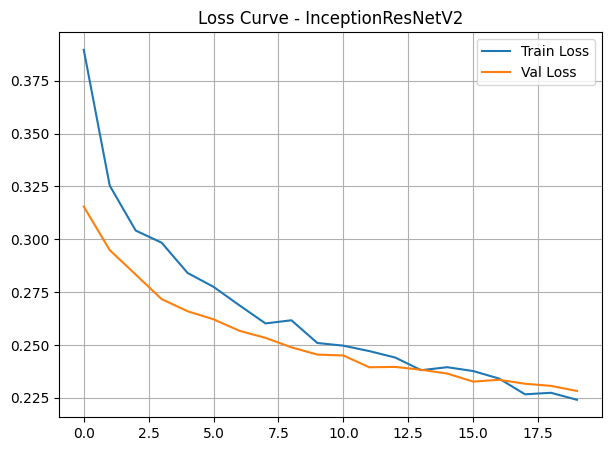

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7,5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title("Loss Curve - InceptionResNetV2")
plt.legend(); plt.grid(); plt.show()

In [ ]:
from sklearn.metrics import classification_report, roc_auc_score
import numpy as np

y_pred_prob = model.predict(val_ds)
y_pred = (y_pred_prob > 0.5).astype(int)

print("Classification Report:")
print(classification_report(y_val, y_pred, target_names=label_cols, zero_division=0))

print("Macro AUC:", roc_auc_score(y_val, y_pred_prob, average="macro"))
print("Micro AUC:", roc_auc_score(y_val, y_pred_prob, average="micro"))

14/14 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step
Classification Report:
                                  precision    recall  f1-score   support

                    Disease_Risk       1.00      1.00      1.00       222
            Diabetic Retinopathy       0.81      0.65      0.72        60
                    Macular Hole       0.75      0.84      0.80        58
              Optic Disk Cupping       0.79      0.34      0.47        68
              Tessellated Fundus       0.75      0.11      0.19        28
             Diabetic Neuropathy       0.00      0.00      0.00        24
                          Myopia       1.00      0.19      0.32        21
Age Related Macular Degeneration       0.00      0.00      0.00        10
   Branch Retinal Vein Occlusion       0.00      0.00      0.00        13
                  Optic Disk Pit       0.00      0.00      0.00        11
                Optic Disk Edema       1.00      0.27      0.43        11

                       micro avg       0.91     

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:379: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


In [ ]:
label_cols = [
    c for c in df.columns
    if (c not in [id_col, "image_path"]) and ("risk" not in c.lower())
]
print(label_cols)


['Diabetic Retinopathy', 'Macular Hole', 'Optic Disk Cupping', 'Tessellated Fundus', 'Diabetic Neuropathy', 'Myopia', 'Age Related Macular Degeneration', 'Branch Retinal Vein Occlusion', 'Optic Disk Pit', 'Optic Disk Edema']


In [ ]:
train_ds = create_dataset(X_train, y_train[:, :len(label_cols)], augment=True)
val_ds   = create_dataset(X_val, y_val[:, :len(label_cols)])


In [ ]:
feature_model = tf.keras.Model(inputs=model.input, outputs=model.layers[-2].output)

train_features, train_labels = [], []
val_features, val_labels = [], []

for img_batch, lbl_batch in train_ds:
    train_features.append(feature_model.predict(img_batch))
    train_labels.append(lbl_batch.numpy())

for img_batch, lbl_batch in val_ds:
    val_features.append(feature_model.predict(img_batch))
    val_labels.append(lbl_batch.numpy())

X_train_f = np.vstack(train_features)
Y_train_f = np.vstack(train_labels)
X_val_f = np.vstack(val_features)
Y_val_f = np.vstack(val_labels)

print("New shapes:", X_train_f.shape, X_val_f.shape)


1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0

In [ ]:
from xgboost import XGBClassifier
from sklearn.multiclass import OneVsRestClassifier

xgb = OneVsRestClassifier(XGBClassifier(
    n_estimators=300,
    max_depth=6,
    learning_rate=0.03,
    subsample=0.8,
    colsample_bytree=0.8,
    n_jobs=-1,
    eval_metric="logloss"   # avoids warning
))

xgb.fit(X_train_f, Y_train_f)
print("XGBoost trained successfully on train data!")


/usr/local/lib/python3.12/dist-packages/sklearn/multiclass.py:90: UserWarning: Label 0 is present in all training examples.
  warnings.warn(


XGBoost trained successfully on train data!


In [ ]:
# 🔹 Get probability predictions from XGBoost on validation data
y_xgb_prob = xgb.predict_proba(X_val_f)          # probability output
y_xgb_pred = (y_xgb_prob > 0.5).astype(int)      # convert to 0/1 classification

# 🔹 Calculate AUC (Micro & Macro)
from sklearn.metrics import roc_auc_score, classification_report

print("\n📊 XGBoost Evaluation on VALIDATION DATA:")
print("Micro AUC:", roc_auc_score(Y_val_f, y_xgb_prob, average="micro"))
print("Macro AUC:", roc_auc_score(Y_val_f, y_xgb_prob, average="macro"))

# 🔹 Classification Report (Optional – for your PPT)
print("\nClassification Report:")
print(classification_report(Y_val_f, y_xgb_pred, target_names=label_cols))



📊 XGBoost Evaluation on VALIDATION DATA:
Micro AUC: 0.9432907211798537
Macro AUC: nan

Classification Report:
                                  precision    recall  f1-score   support

            Diabetic Retinopathy       1.00      1.00      1.00       222
                    Macular Hole       0.79      0.70      0.74        60
              Optic Disk Cupping       0.78      0.81      0.80        58
              Tessellated Fundus       0.71      0.47      0.57        68
             Diabetic Neuropathy       0.80      0.43      0.56        28
                          Myopia       0.38      0.21      0.27        24
Age Related Macular Degeneration       0.80      0.57      0.67        21
   Branch Retinal Vein Occlusion       0.00      0.00      0.00        10
                  Optic Disk Pit       1.00      0.15      0.27        13
                Optic Disk Edema       0.00      0.00      0.00        11

                       micro avg       0.88      0.73      0.80       515

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:379: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
import pandas as pd

df = pd.read_excel(CSV_PATH)   # This loads your dataset correctly
possible = [c for c in df.columns if 'diabetic' in c.lower()]

dist = {}
for col in possible:
    dist[col] = df[col].value_counts().to_dict()

dist


{'Diabetic Retinopathy': {0: 1544, 1: 376, 376: 1},
 'Diabetic Neuropathy': {0: 1782, 1: 138, 138: 1}}

In [ ]:
# 🔹 Get probability predictions from XGBoost on validation data
y_xgb_prob = xgb.predict_proba(X_val_f)          # probability output
y_xgb_pred = (y_xgb_prob > 0.5).astype(int)      # convert to 0/1 classification

# 🔹 Calculate AUC (Micro & Macro)
from sklearn.metrics import roc_auc_score, classification_report

print("\nXGBoost Evaluation on VALIDATION DATA:")
print("Micro AUC:", roc_auc_score(Y_val_f, y_xgb_prob, average="micro"))
print("Macro AUC:", roc_auc_score(Y_val_f, y_xgb_prob, average="macro"))

# 🔹 Classification Report (Optional – for your PPT)
print("\nClassification Report:")
print(classification_report(Y_val_f, y_xgb_pred, target_names=label_cols))



XGBoost Evaluation on VALIDATION DATA:
Micro AUC: 0.9432907211798537
Macro AUC: nan

Classification Report:
                                  precision    recall  f1-score   support

            Diabetic Retinopathy       1.00      1.00      1.00       222
                    Macular Hole       0.79      0.70      0.74        60
              Optic Disk Cupping       0.78      0.81      0.80        58
              Tessellated Fundus       0.71      0.47      0.57        68
             Diabetic Neuropathy       0.80      0.43      0.56        28
                          Myopia       0.38      0.21      0.27        24
Age Related Macular Degeneration       0.80      0.57      0.67        21
   Branch Retinal Vein Occlusion       0.00      0.00      0.00        10
                  Optic Disk Pit       1.00      0.15      0.27        13
                Optic Disk Edema       0.00      0.00      0.00        11

                       micro avg       0.88      0.73      0.80       515
 

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:379: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
from sklearn.metrics import roc_auc_score

# Deep Learning model AUC (InceptionResNetV2)
print("🔹 InceptionResNetV2 Micro AUC:", roc_auc_score(y_val, y_pred_prob, average="micro"))

# XGBoost predictions on VALIDATION set (IMPORTANT!)
y_xgb_prob = xgb.predict_proba(X_val_f)
print("🔹 XGBoost Micro AUC:", roc_auc_score(Y_val_f, y_xgb_prob, average="micro"))


🔹 InceptionResNetV2 Micro AUC: 0.9359466410535255
🔹 XGBoost Micro AUC: 0.9432907211798537


In [ ]:
# prints model output shape and label count
print("Model output shape:", model.output_shape)   # e.g. (None, 12) for 12 labels
print("Number of labels:", len(label_cols))

# Predict on one image and inspect shape
img = Image.open(X_val[0]).resize(IMG_SIZE)
img_arr = np.array(img)
print("Single image shape (before preprocess):", img_arr.shape)

pred = model.predict(np.expand_dims(img_arr.astype(np.float32), 0))
print("pred array shape:", pred.shape)    # e.g. (1, 12) or (1,) or (1,1)
print("pred[0] length:", len(pred[0]))
print("pred[0] sample:", pred[0][:10])


Model output shape: (None, 11)
Number of labels: 10
Single image shape (before preprocess): (299, 299, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
pred array shape: (1, 11)
pred[0] length: 11
pred[0] sample: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0.]


In [ ]:
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
import numpy as np
from PIL import Image

def predict_image(path, use_preprocess=True):
    img = Image.open(path).convert("RGB").resize(IMG_SIZE)
    img_arr = np.array(img).astype(np.float32)

    # use same preprocessing as training — change if you used /255 instead
    if use_preprocess:
        # preprocess_input expects values in [0,255]
        img_arr_pp = preprocess_input(img_arr)
    else:
        img_arr_pp = img_arr / 255.0

    pred = model.predict(np.expand_dims(img_arr_pp, 0))[0]

    # normalize pred to 1D array
    pred = np.asarray(pred).ravel()
    out = {}

    if pred.size == len(label_cols):
        # ideal case: one probability per label
        out = {label_cols[i]: float(pred[i]) for i in range(len(label_cols))}
    elif pred.size == 1 and len(label_cols) == 1:
        # single-label, single-output
        out = {label_cols[0]: float(pred[0])}
    else:
        # fallback: map as many as possible and warn
        m = min(pred.size, len(label_cols))
        out = {label_cols[i]: float(pred[i]) for i in range(m)}
        print(f"Warning: model returned {pred.size} outputs but you have {len(label_cols)} labels. Mapped first {m} entries.")
    return out

# test
sample_image = X_val[0]
print("Predicted for:", sample_image)
print(predict_image(sample_image, use_preprocess=True))


Predicted for: /content/drive/MyDrive/ML PROJECT/Myopia/1116.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
{'Diabetic Retinopathy': 0.9932880997657776, 'Macular Hole': 0.06967036426067352, 'Optic Disk Cupping': 0.7008447051048279, 'Tessellated Fundus': 0.1527794897556305, 'Diabetic Neuropathy': 0.3143579363822937, 'Myopia': 0.015466849319636822, 'Age Related Macular Degeneration': 0.1852375715970993, 'Branch Retinal Vein Occlusion': 0.046229563653469086, 'Optic Disk Pit': 0.053592219948768616, 'Optic Disk Edema': 0.0962638109922409}


In [ ]:
# === REDEFINE make_dataset() safely ===
import tensorflow as tf
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
import numpy as np

IMG_SIZE = (299, 299)
BATCH_SIZE = 16
AUTOTUNE = tf.data.AUTOTUNE

def decode_and_resize(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32)
    return img, label

def apply_preprocess(img, label):
    # same as model training: preprocess_input expects 0..255
    img = preprocess_input(img)
    return img, label

def make_dataset(paths, labels, augment=False, shuffle=False, batch_size=BATCH_SIZE):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))

    if shuffle:
        ds = ds.shuffle(buffer_size=len(paths), reshuffle_each_iteration=True)

    ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    ds = ds.map(apply_preprocess, num_parallel_calls=AUTOTUNE)

    ds = ds.batch(batch_size).prefetch(AUTOTUNE)
    return ds


In [ ]:
# create a tf.data dataset like earlier so preprocessing is identical
val_ds_for_pred = make_dataset(X_val, y_val, augment=False, shuffle=False, batch_size=BATCH_SIZE)

# Predict on whole val set
y_pred_prob = model.predict(val_ds_for_pred, verbose=1)

# ensure shape is (n_samples, num_classes)
y_pred_prob = np.asarray(y_pred_prob)
print("y_pred_prob.shape:", y_pred_prob.shape)
print("y_val.shape:", y_val.shape)


14/14 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step
y_pred_prob.shape: (222, 11)
y_val.shape: (222, 11)


In [ ]:
# === Helper: convert binary vector to label names ===
def decode_labels(binary_vec, label_names):

    return [label_names[i] for i, v in enumerate(binary_vec) if v == 1]



=== 10 Sample Retina Images: Actual vs Predicted ===



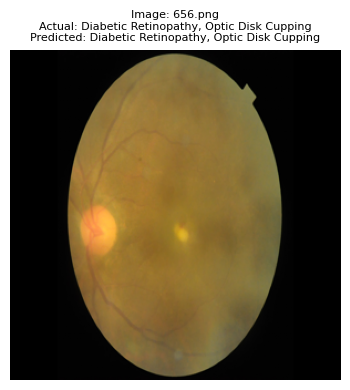

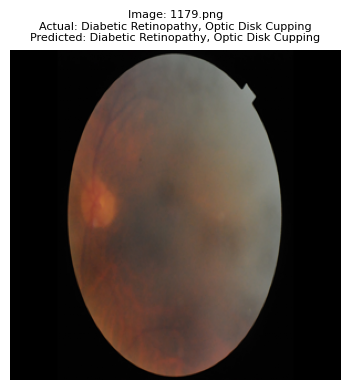

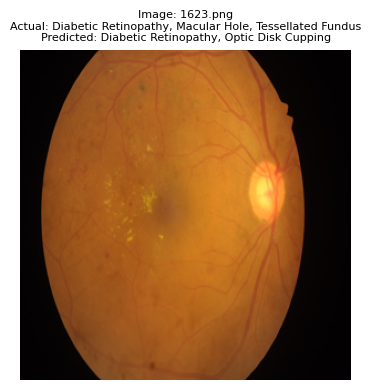

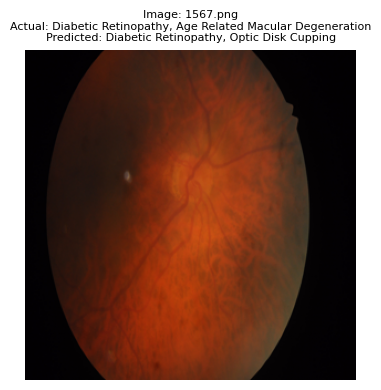

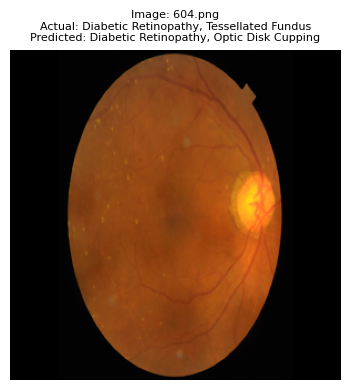

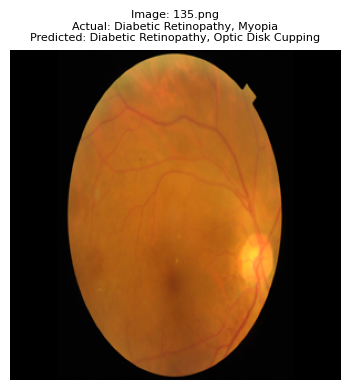

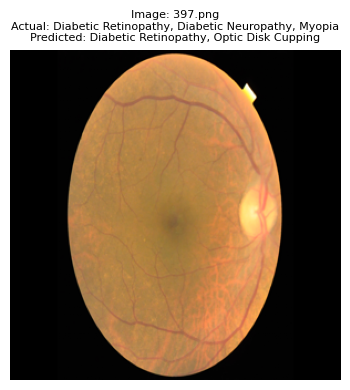

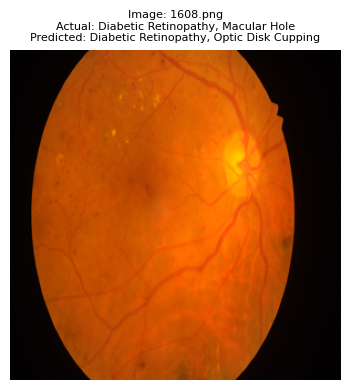

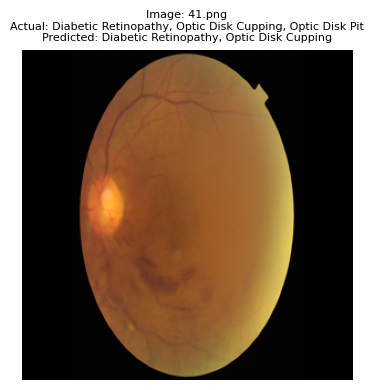

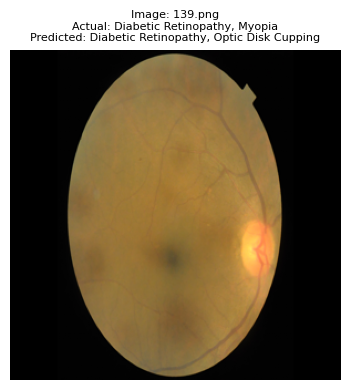

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os

THRESH = 0.5  # adjust threshold if needed

print("\n=== 10 Sample Retina Images: Actual vs Predicted ===\n")

num_samples = min(10, len(X_val))
indices = np.random.choice(len(X_val), num_samples, replace=False)

for idx in indices:
    img_path = X_val[idx]
    true_vec = y_val[idx].astype(int)

    # get predicted probabilities
    pred_probs = np.asarray(y_pred_prob[idx]).ravel()

    # safe thresholding
    if pred_probs.size == true_vec.size:
        pred_vec = (pred_probs > THRESH).astype(int)
    elif pred_probs.size == 1 and true_vec.size == 1:
        pred_vec = (pred_probs > THRESH).astype(int)
    else:
        top_k = min(3, pred_probs.size)
        top_idx = (-pred_probs).argsort()[:top_k]
        pred_vec = np.zeros_like(true_vec)
        for i in range(min(pred_vec.size, top_idx.size)):
            pred_vec[i] = 1
        print(f"Warning: shape mismatch — showing top-{top_k} predictions.")

    # decode labels
    true_labels = decode_labels(true_vec, label_cols)
    pred_labels = decode_labels(pred_vec, label_cols)

    # load and show image
    img = Image.open(img_path).convert("RGB").resize(IMG_SIZE)
    img_arr = np.array(img) / 255.0

    plt.figure(figsize=(4,4))
    plt.imshow(img_arr)
    plt.axis("off")
    plt.title(
        "Image: {}\nActual: {}\nPredicted: {}".format(
            os.path.basename(img_path),
            ", ".join(true_labels) if true_labels else "None",
            ", ".join(pred_labels) if pred_labels else "None"
        ),
        fontsize=8
    )
    plt.tight_layout()
    plt.show()

    # add vertical spacing after each image
    print("\n\n")


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

def saliency_heatmap(img_path, model):
    """Generate heatmap using gradients of top predicted label."""
    img_raw = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img_raw, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32) / 255.0
    img_batch = tf.expand_dims(img, axis=0)

    with tf.GradientTape() as tape:
        tape.watch(img_batch)
        preds = model(img_batch, training=False)
        class_idx = tf.argmax(preds[0])
        loss = preds[:, class_idx]
    grads = tape.gradient(loss, img_batch)
    grads = tf.math.abs(grads)
    grads = tf.reduce_max(grads, axis=-1)[0]  # convert to (H,W)
    grads -= tf.reduce_min(grads)
    grads /= (tf.reduce_max(grads) + 1e-8)  # normalize
    heatmap = grads.numpy()
    img_np = img.numpy()
    cls_name = label_cols[int(class_idx)]  # predicted disease name only
    return img_np, heatmap, cls_name

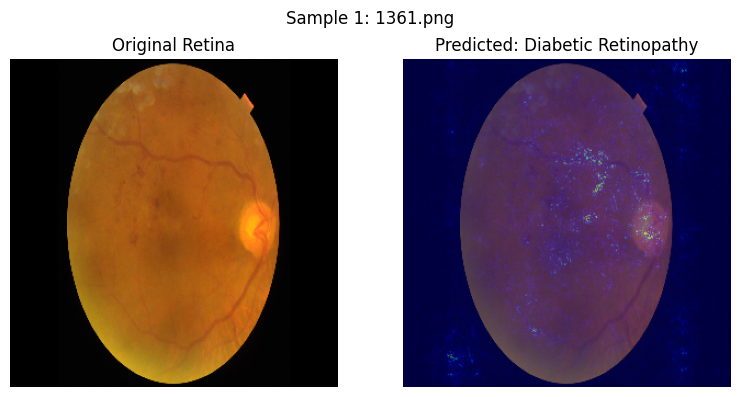

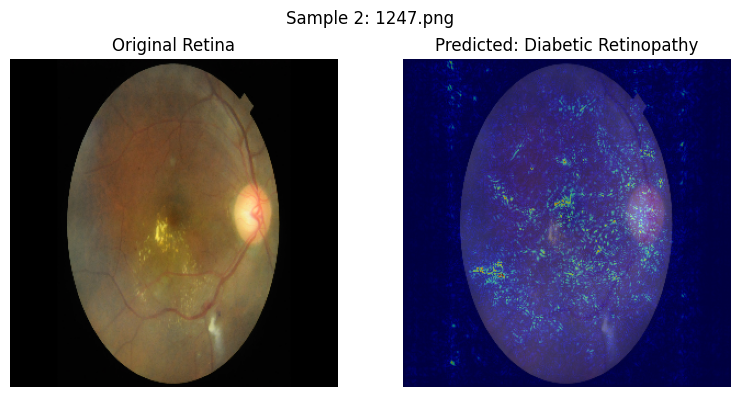

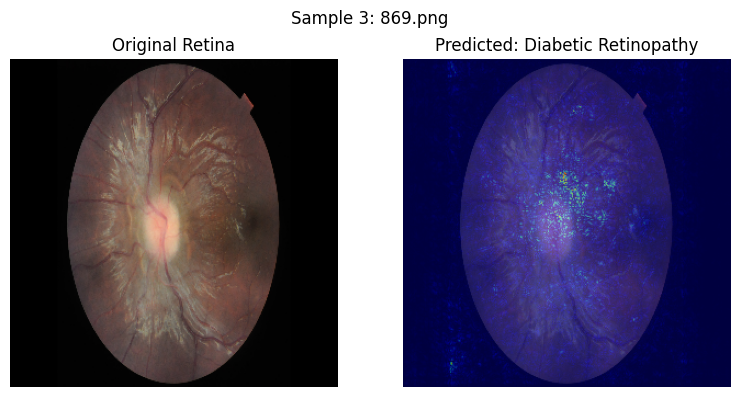

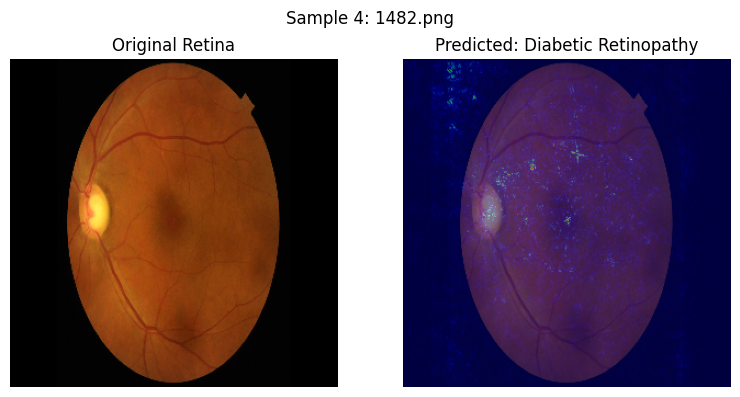

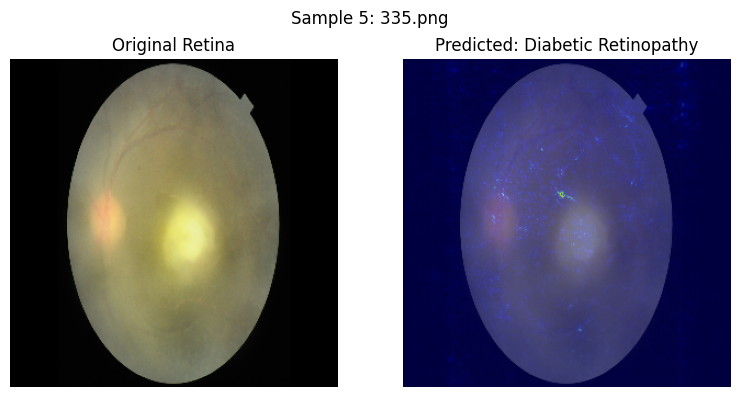

...

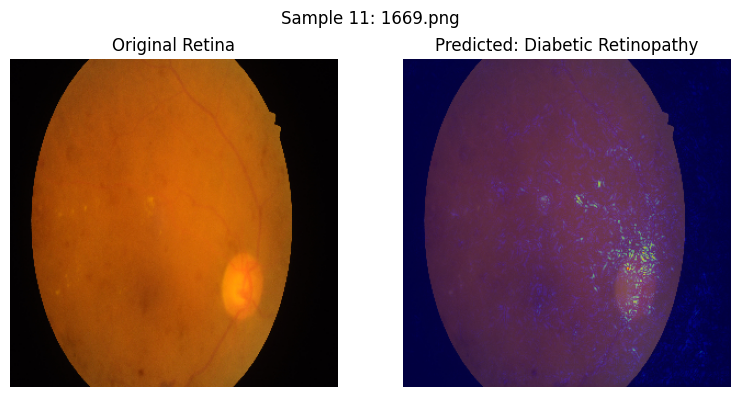

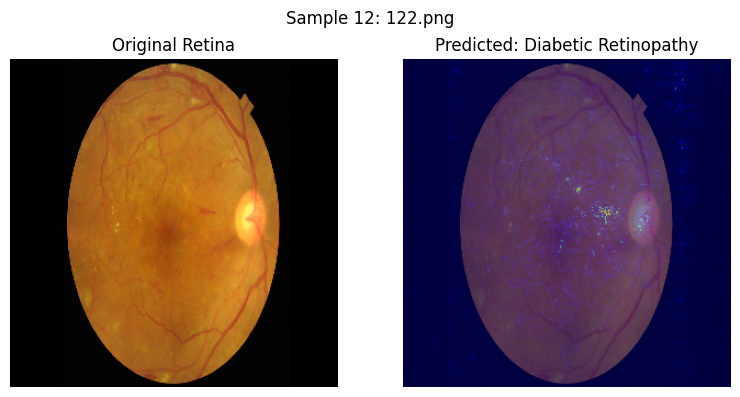

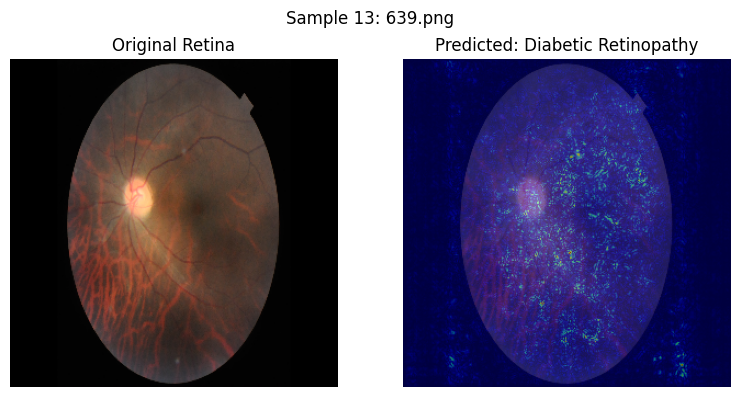

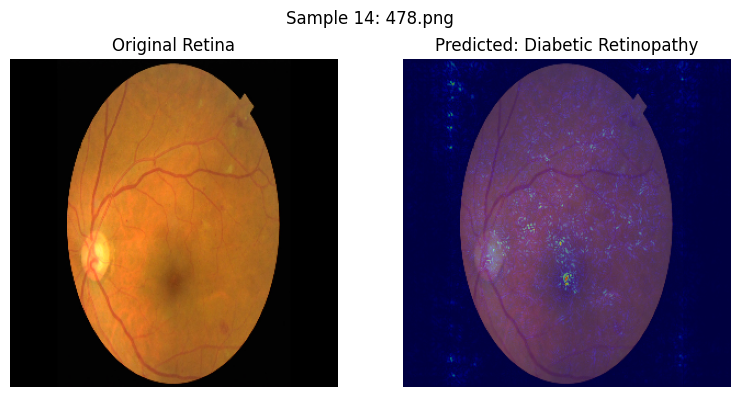

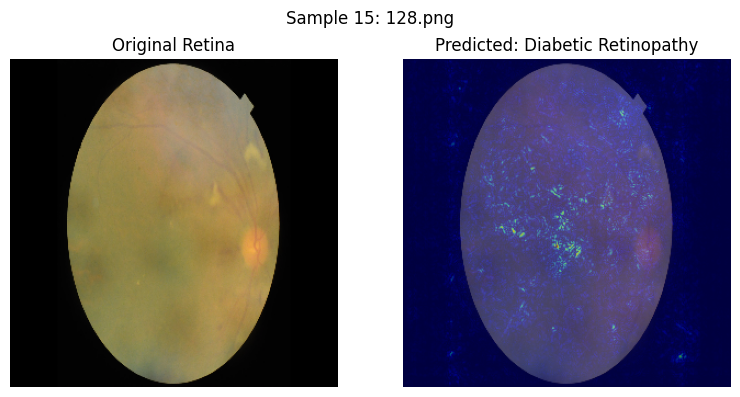

In [ ]:
num_samples = min(15, len(X_val))
indices = np.random.choice(len(X_val), num_samples, replace=False)

for i, idx in enumerate(indices):
    path = X_val[idx]
    img_np, heatmap, cls_name = saliency_heatmap(path, model)

    plt.figure(figsize=(8,4))

    # Original
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.axis('off')
    plt.title("Original Retina")

    # Heatmap Overlay
    plt.subplot(1, 2, 2)
    plt.imshow(img_np)
    plt.imshow(heatmap, cmap="jet", alpha=0.5)
    plt.axis('off')
    plt.title(f"Predicted: {cls_name}")

    plt.suptitle(f"Sample {i+1}: {os.path.basename(path)}")
    plt.tight_layout()
    plt.show()

 Showing ONLY Saliency Maps for 12 Retina Scans


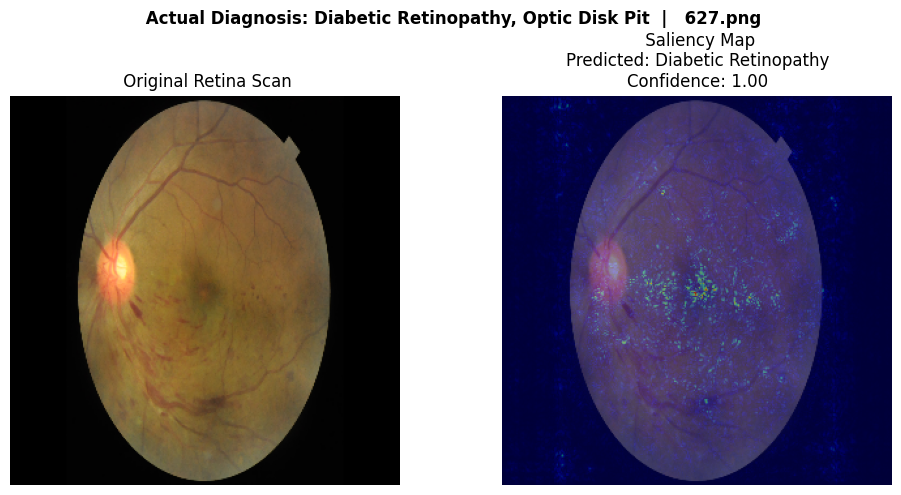

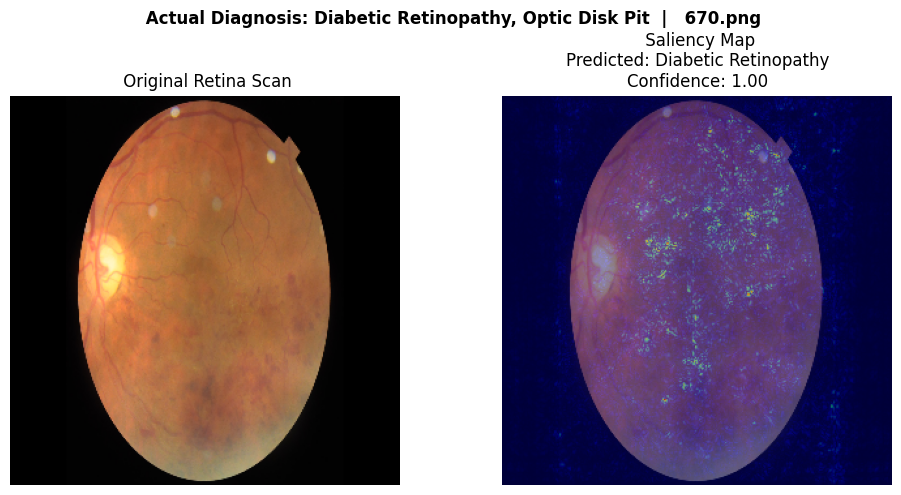

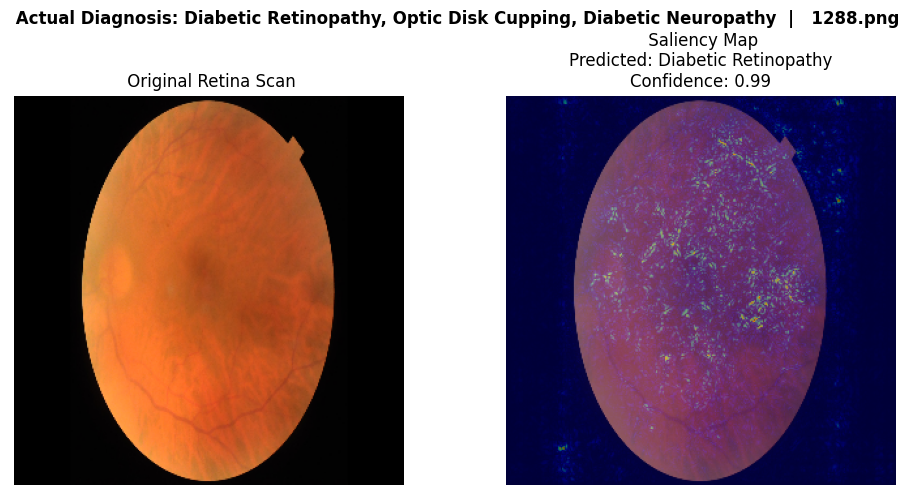

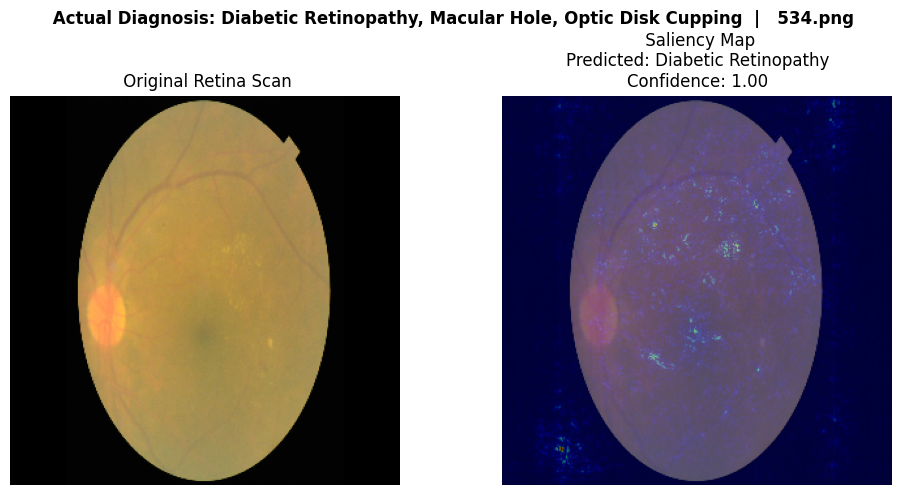

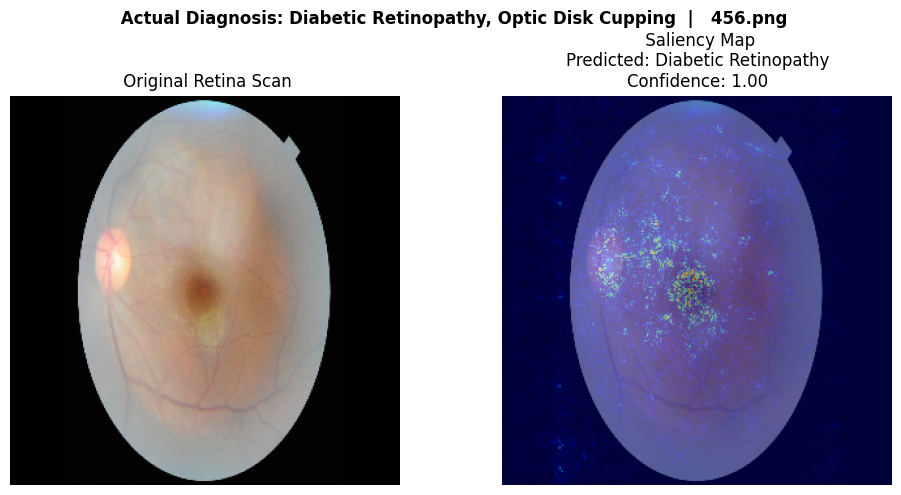

...

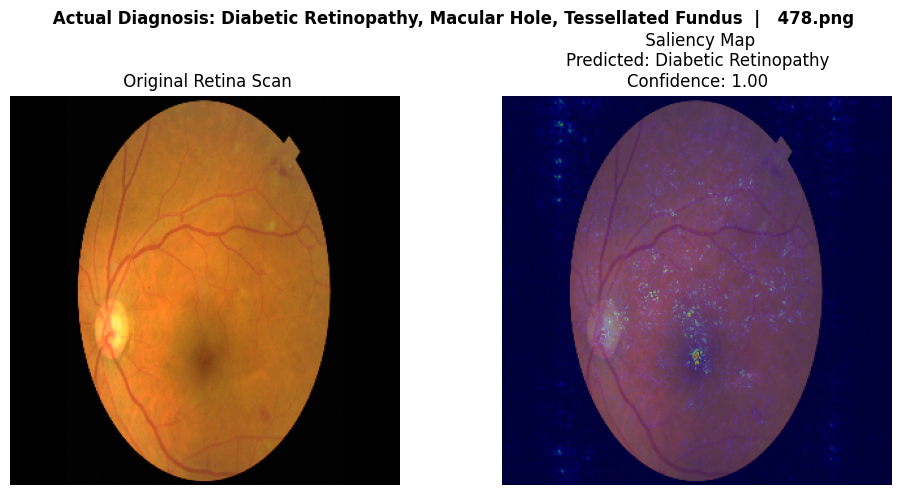

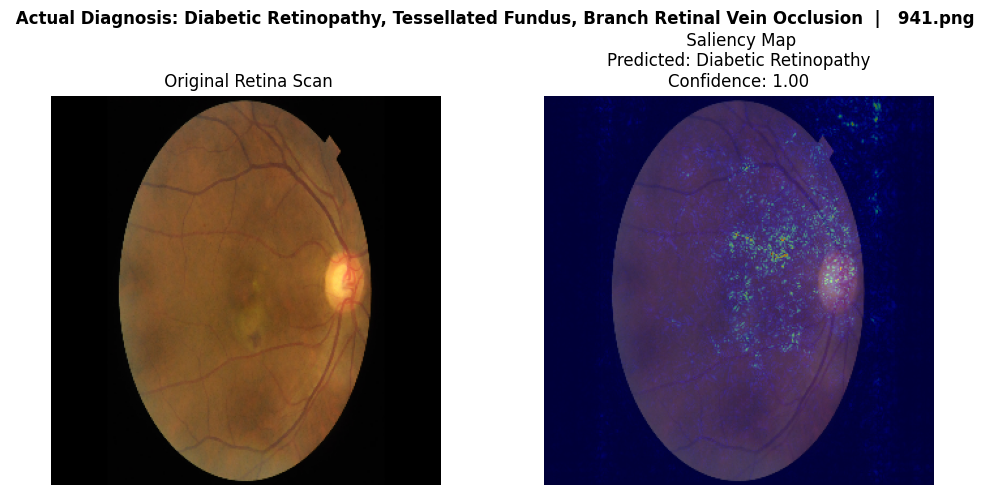

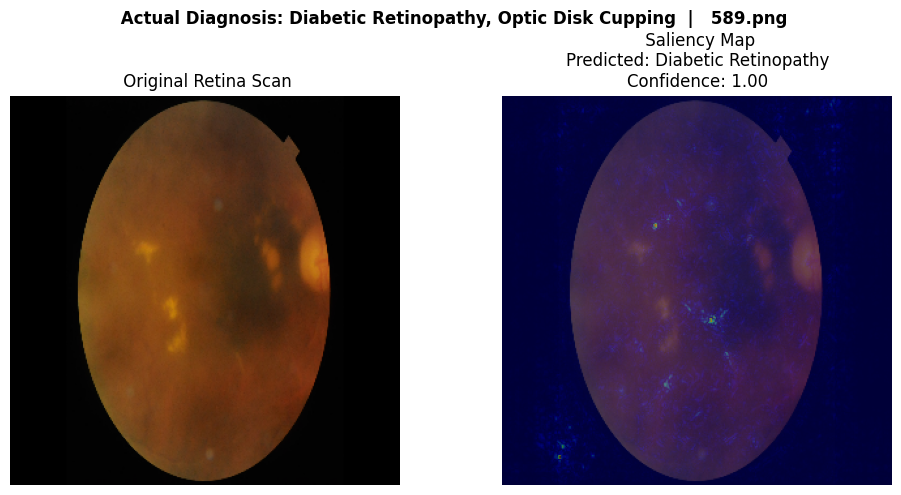

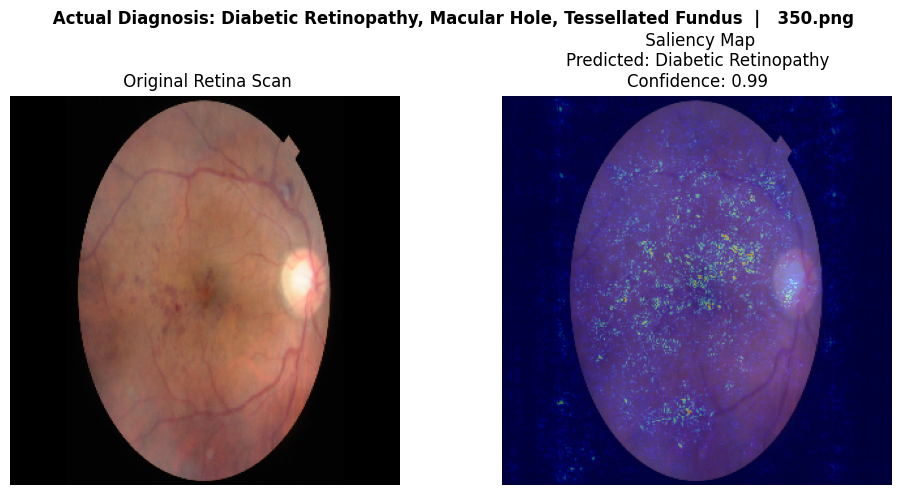

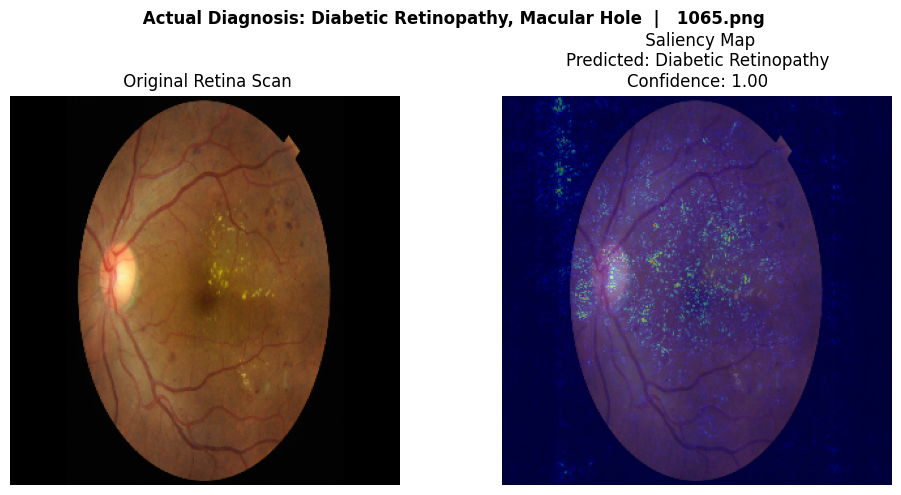

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

#  SALIENCY FUNCTION (already working for you)
def saliency_heatmap(img_path, model):
    img_raw = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img_raw, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32) / 255.0
    img_batch = tf.expand_dims(img, axis=0)

    with tf.GradientTape() as tape:
        tape.watch(img_batch)
        preds = model(img_batch, training=False)
        class_idx = tf.argmax(preds[0])
        loss = preds[:, class_idx]

    grads = tape.gradient(loss, img_batch)
    grads = tf.math.abs(grads)
    grads = tf.reduce_max(grads, axis=-1)[0]  # (H,W)

    # normalize
    grads -= tf.reduce_min(grads)
    grads /= (tf.reduce_max(grads) + 1e-8)

    return img.numpy(), grads.numpy(), int(class_idx), float(preds[0][class_idx])


# 🔹 VISUALIZATION (ONLY SALIENCY MAP)
num_samples = min(12, len(X_val))   # Show 12 best samples
indices = np.random.choice(len(X_val), num_samples, replace=False)

print(f" Showing ONLY Saliency Maps for {num_samples} Retina Scans")

for idx in indices:
    img_path = X_val[idx]
    img_np, heatmap, pred_idx, confidence = saliency_heatmap(img_path, model)

    # TRUE LABELS
    true_vec = y_val[idx].astype(int)
    true_labels = [label_cols[i] for i, v in enumerate(true_vec) if v == 1]
    true_text = ", ".join(true_labels) if true_labels else "No Disease"

    # PLOT
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(img_np)
    plt.axis(False)
    plt.title(" Original Retina Scan")

    plt.subplot(1,2,2)
    plt.imshow(img_np)
    plt.imshow(heatmap, cmap="jet", alpha=0.45)
    plt.axis(False)
    plt.title(f" Saliency Map\nPredicted: {label_cols[pred_idx]}\nConfidence: {confidence:.2f}")

    plt.suptitle(f" Actual Diagnosis: {true_text}  |   {os.path.basename(img_path)}",
                 fontsize=12, weight='bold')
    plt.tight_layout()
    plt.show()

In [ ]:
preds = model.predict(img_batch)[0][:10]   # keep only real disease outputs


1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


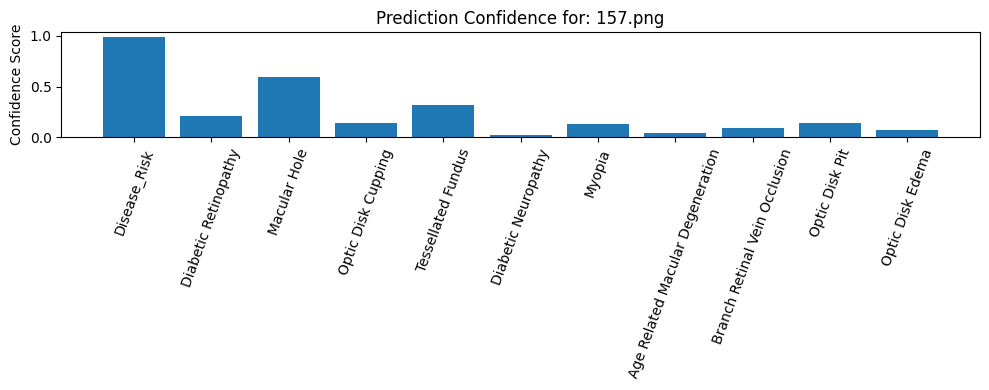

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
import os

def show_prediction_confidence(img_path, model):
    # Load image (RGB) and resize
    img = Image.open(img_path).convert("RGB").resize(IMG_SIZE)
    img_arr = np.array(img).astype(np.float32)

    # Same preprocessing as training
    img_pp = preprocess_input(img_arr)   # expects 0..255

    # Expand batch dimension
    img_batch = np.expand_dims(img_pp, axis=0)

    # Predict (model outputs 11 values)
    preds_full = model.predict(img_batch)[0]

    # ---- PATCH: use only the first 10 predictions ----
    preds = preds_full[:len(label_cols)]
    # ---------------------------------------------------

    plt.figure(figsize=(10,4))
    plt.bar(label_cols, preds)
    plt.xticks(rotation=70)
    plt.ylabel("Confidence Score")
    plt.title(f"Prediction Confidence for: {os.path.basename(img_path)}")
    plt.tight_layout()
    plt.show()

# Example usage
show_prediction_confidence(X_val[10], model)


In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np

THRESH = 0.5  # use same threshold as predictions

# y_true → y_val
# y_pred → y_pred_prob[:, :len(label_cols)]  (drop extra model output)

y_true = y_val.astype(int)
y_pred = (y_pred_prob[:, :len(label_cols)] > THRESH).astype(int)

cms = []  # list of confusion matrices

for i in range(len(label_cols)):
    cm = confusion_matrix(y_true[:, i], y_pred[:, i])
    cms.append(cm)


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


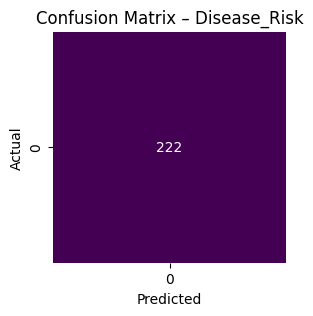

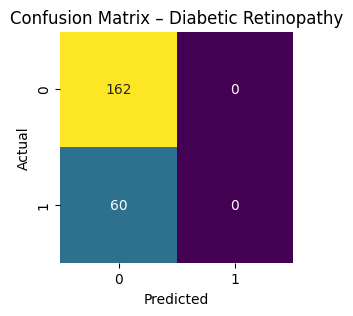

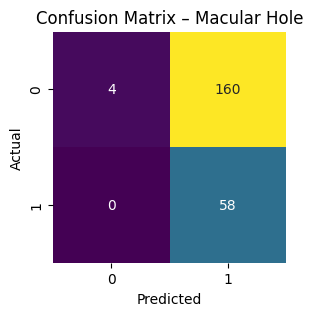

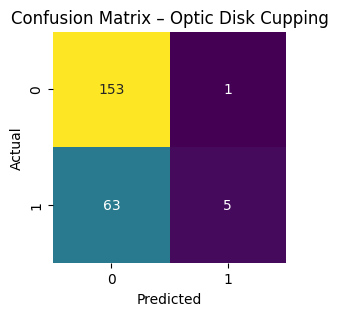

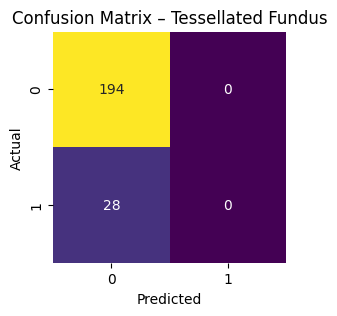

...

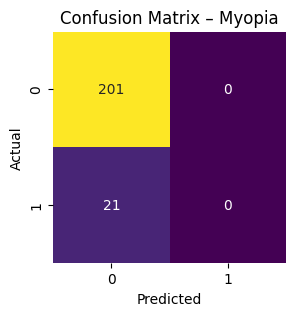

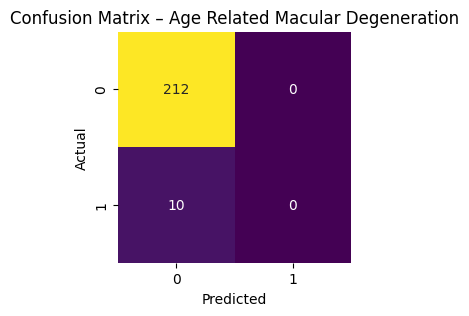

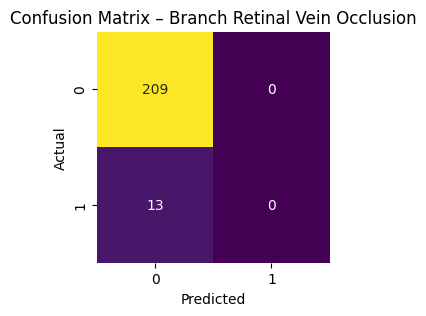

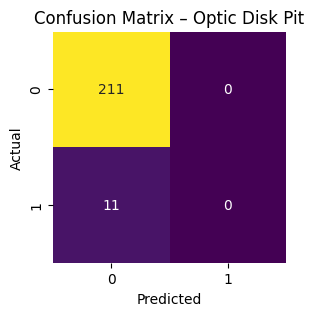

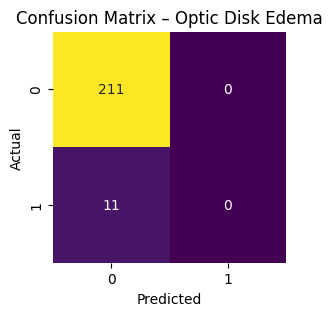

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

for i, label in enumerate(label_cols):
    plt.figure(figsize=(3,3))
    sns.heatmap(
        cms[i],
        annot=True,
        fmt="d",
        cmap="viridis",
        cbar=False
    )
    plt.title(f"Confusion Matrix – {label}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()
    print("\n")  # spacing between images


In [ ]:
label_cols = [
    'Diabetic Retinopathy',
    'Macular Hole',
    'Optic Disk Cupping',
    'Tessellated Fundus',
    'Diabetic Neuropathy',
    'Myopia',
    'Age Related Macular Degeneration',
    'Branch Retinal Vein Occlusion',
    'Optic Disk Pit',
    'Optic Disk Edema'
]
labels = df[label_cols].values


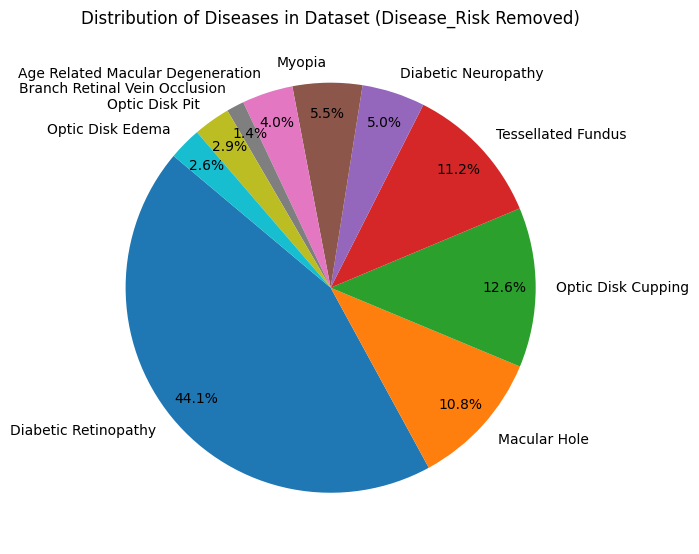

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Use cleaned arrays (10 labels)
y_train_clean = y_train[:, :len(label_cols)]
y_val_clean   = y_val[:, :len(label_cols)]

# Compute distribution
disease_counts = y_train_clean.sum(axis=0) + y_val_clean.sum(axis=0)

plt.figure(figsize=(7,7))
plt.pie(
    disease_counts,
    labels=label_cols,
    autopct='%1.1f%%',
    startangle=140,
    pctdistance=0.85
)
plt.title("Distribution of Diseases in Dataset (Disease_Risk Removed)")
plt.tight_layout()
plt.show()



🔍 Showing 10 Saliency Maps with Bounding Boxes



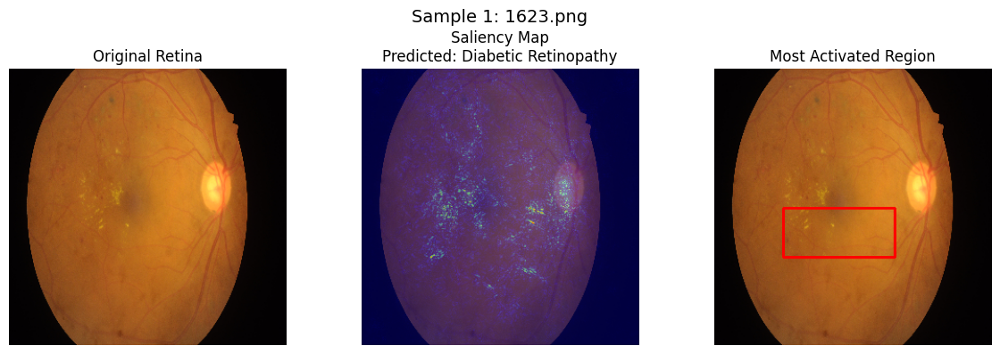

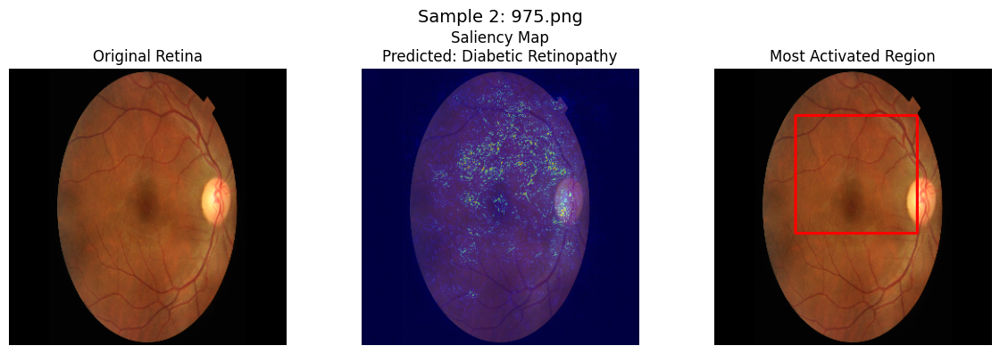

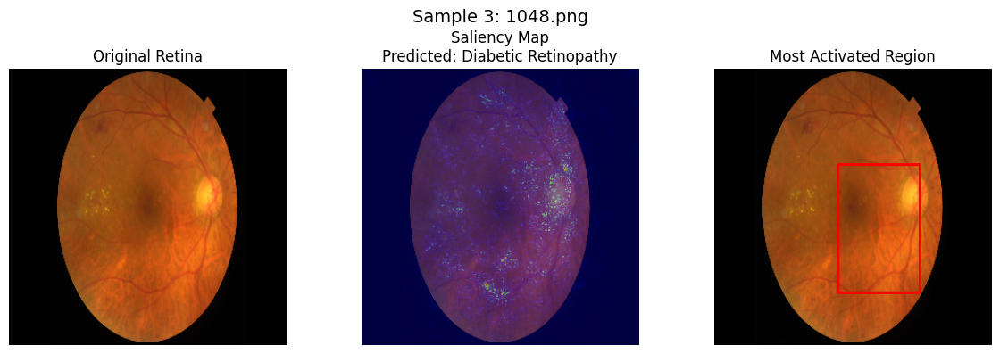

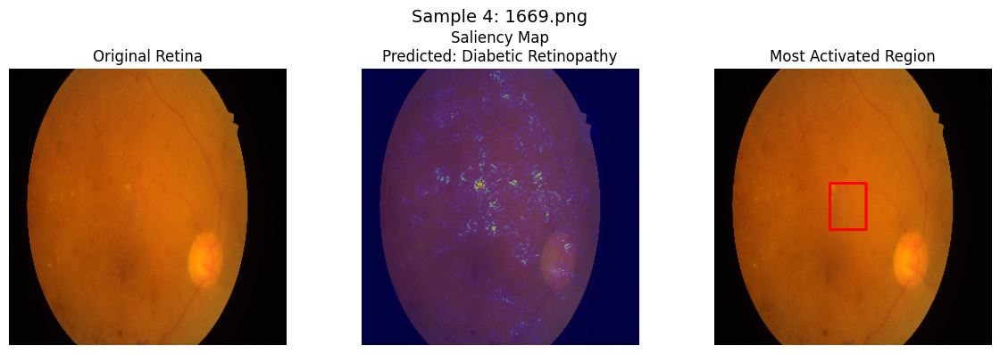

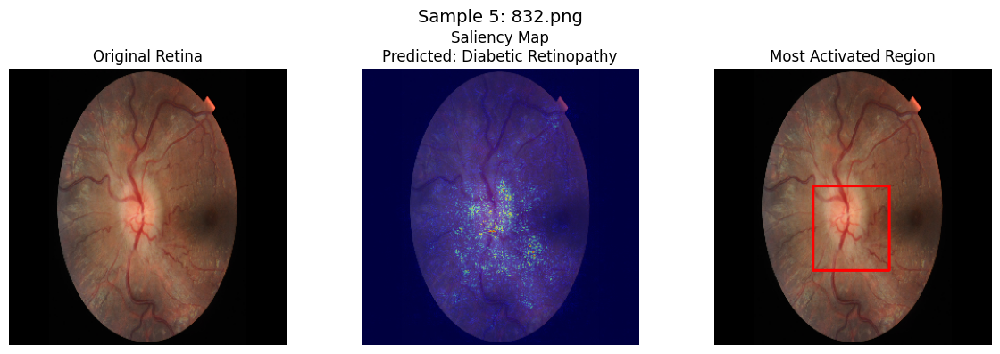

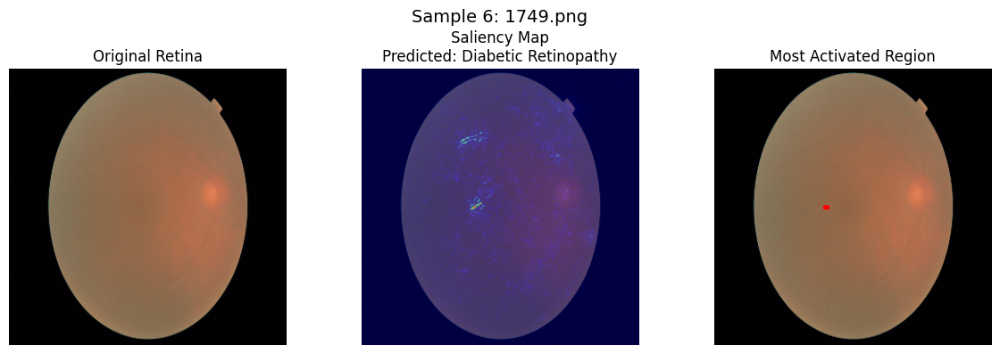

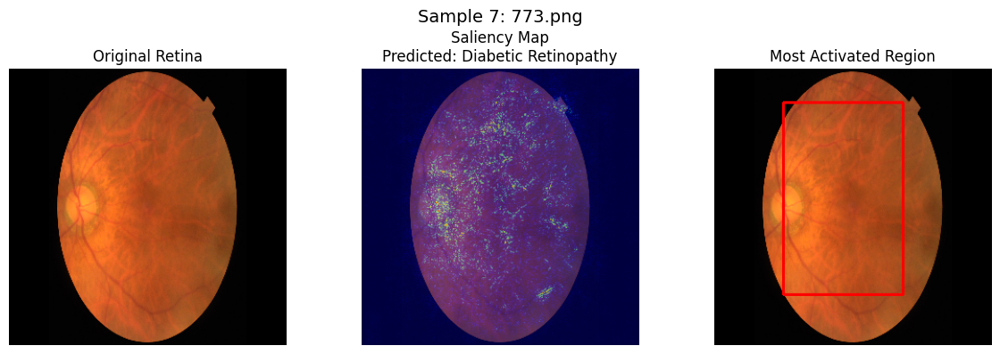

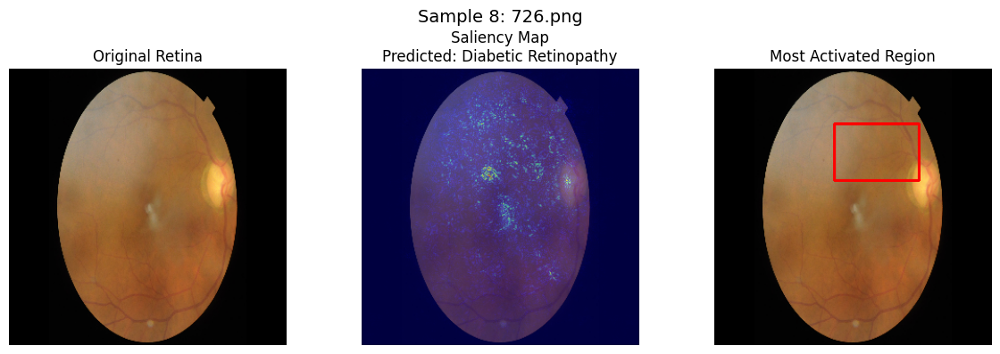

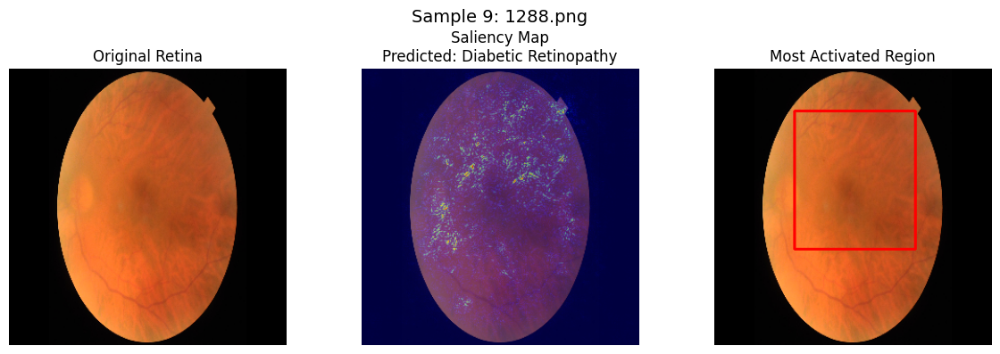

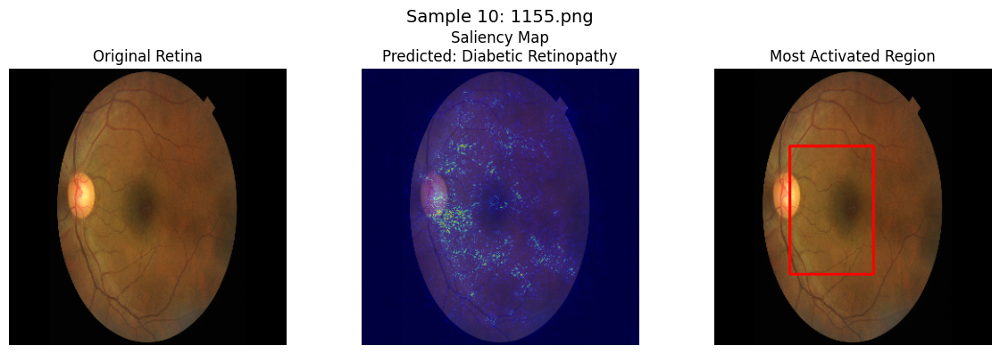

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input

# ---------- FUNCTION: SALIENCY + BOUNDING BOX ----------
def saliency_with_bbox(img_path, model):
    # Load image
    img_raw = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img_raw, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32)

    # IMPORTANT: SAME PREPROCESSING AS TRAINING
    img_pp = preprocess_input(img)

    img_batch = tf.expand_dims(img_pp, axis=0)

    # MULTI-LABEL → pick highest-activated disease *from 10 real diseases*
    with tf.GradientTape() as tape:
        tape.watch(img_batch)
        preds = model(img_batch, training=False)[0]

        # KEEP ONLY FIRST 10 OUTPUTS (ignore Disease_Risk prediction)
        preds_10 = preds[:len(label_cols)]
        class_idx = tf.argmax(preds_10)   # best activated real disease

        loss = preds_10[class_idx]

    # Compute gradients
    grads = tape.gradient(loss, img_batch)
    grads = tf.math.abs(grads)
    heatmap = tf.reduce_max(grads, axis=-1)[0]  # H × W

    # Normalize heatmap
    heatmap_min = tf.reduce_min(heatmap)
    heatmap_max = tf.reduce_max(heatmap)
    heatmap = (heatmap - heatmap_min) / (heatmap_max - heatmap_min + 1e-8)
    heatmap_np = heatmap.numpy()

    # Threshold to detect activated region
    thr = 0.6
    activated = heatmap_np > thr
    coords = np.column_stack(np.where(activated))

    # No activation => return None box
    if coords.size == 0:
        return img.numpy() / 255.0, heatmap_np, None, label_cols[int(class_idx)]

    # Compute bounding box
    y_min, x_min = coords.min(axis=0)
    y_max, x_max = coords.max(axis=0)

    return img.numpy() / 255.0, heatmap_np, (x_min, y_min, x_max, y_max), label_cols[int(class_idx)]


# ---------- DISPLAY SALIENCY FOR 10 RANDOM VALIDATION IMAGES ----------
num_samples = min(10, len(X_val))
indices = np.random.choice(len(X_val), num_samples, replace=False)

print(f"\n🔍 Showing {num_samples} Saliency Maps with Bounding Boxes\n")

for i, idx in enumerate(indices):
    path = X_val[idx]
    img_np, heatmap, bbox, pred_label = saliency_with_bbox(path, model)

    plt.figure(figsize=(12,4))

    # ORIGINAL IMAGE
    plt.subplot(1, 3, 1)
    plt.imshow(img_np)
    plt.axis('off')
    plt.title("Original Retina")

    # HEATMAP
    plt.subplot(1, 3, 2)
    plt.imshow(img_np)
    plt.imshow(heatmap, cmap='jet', alpha=0.5)
    plt.axis('off')
    plt.title(f"Saliency Map\nPredicted: {pred_label}")

    # BOUNDING BOX
    plt.subplot(1, 3, 3)
    overlay = img_np.copy()

    if bbox:
        x1, y1, x2, y2 = bbox
        overlay = cv2.rectangle(
            (overlay * 255).astype(np.uint8),
            (x1, y1), (x2, y2),
            (255, 0, 0), 2
        )
        plt.title("Most Activated Region")
    else:
        overlay = (overlay * 255).astype(np.uint8)
        plt.title("No Strong Activation")

    plt.imshow(overlay)
    plt.axis('off')

    plt.suptitle(f"Sample {i+1}: {os.path.basename(path)}", fontsize=14)
    plt.tight_layout()
    plt.show()
    print("\n\n")


In [ ]:
def find_last_conv_layer_base(base_model):
    for layer in reversed(base_model.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            return layer.name
    raise ValueError("No Conv2D layer found in base_model.")


In [ ]:
last_conv_name = find_last_conv_layer_base(base_model)
print("Last conv layer:", last_conv_name)


Last conv layer: conv_7b


Using last conv layer from base_model: conv_7b
Generating Grad-CAMs for: /content/drive/MyDrive/ML PROJECT/Myopia/1116.png
Error computing Grad-CAM for Diabetic Retinopathy: "Exception encountered when calling Functional.call().\n\n\x1b139913819374032\x1b\n\nArguments received by Functional.call():\n  • inputs=array([[[[-1., -1., -1.],\n         [-1., -1., -1.],\n         [-1., -1., -1.],\n         ...,\n         [-1., -1., -1.],\n         [-1., -1., -1.],\n         [-1., -1., -1.]],\n\n        [[-1., -1., -1.],\n         [-1., -1., -1.],\n         [-1., -1., -1.],\n         ...,\n         [-1., -1., -1.],\n         [-1., -1., -1.],\n         [-1., -1., -1.]],\n\n        [[-1., -1., -1.],\n         [-1., -1., -1.],\n         [-1., -1., -1.],\n         ...,\n         [-1., -1., -1.],\n         [-1., -1., -1.],\n         [-1., -1., -1.]],\n\n        ...,\n\n        [[-1., -1., -1.],\n         [-1., -1., -1.],\n         [-1., -1., -1.],\n         ...,\n         [-1., -1., -1.],\n         

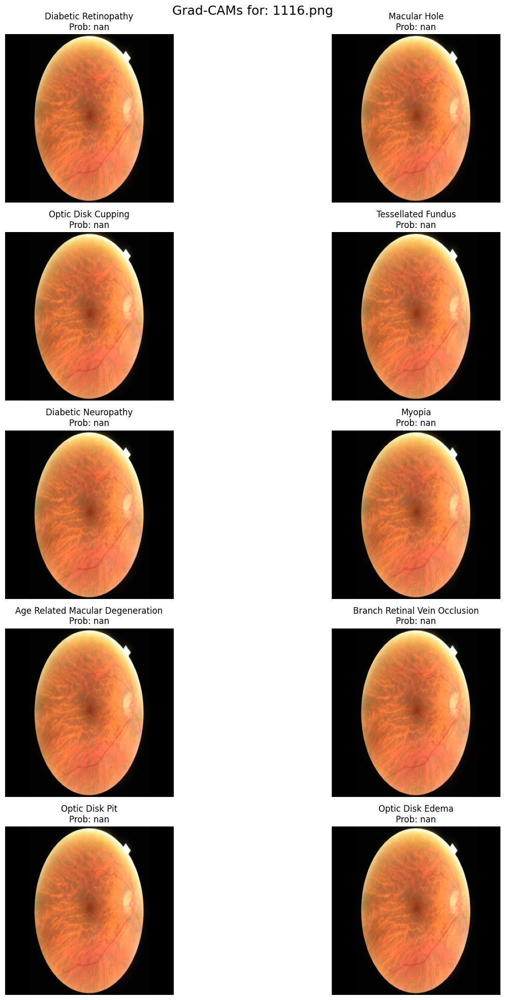

In [ ]:
# Full working Grad-CAM grid for your pipeline (copy-paste and run)
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os

# Sanity checks
if 'model' not in globals():
    raise RuntimeError("`model` not found. Load your trained model first.")
if 'base_model' not in globals():
    raise RuntimeError("`base_model` not found. Make sure you still have the InceptionResNetV2 backbone in variable `base_model`.")
if 'IMG_SIZE' not in globals():
    IMG_SIZE = (299, 299)
    print("IMG_SIZE not found; defaulting to", IMG_SIZE)
if 'label_cols' not in globals():
    raise RuntimeError("`label_cols` not found. Define your 10 disease labels in `label_cols`.")

# 1) find last conv layer in base_model
def find_last_conv_layer_base(bmodel):
    for layer in reversed(bmodel.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            return layer.name
    raise ValueError("No Conv2D layer found in base_model. Can't run Grad-CAM.")

last_conv_name = find_last_conv_layer_base(base_model)
print("Using last conv layer from base_model:", last_conv_name)
last_conv_layer = base_model.get_layer(last_conv_name)

# 2) gradcam function (works with wrapped model by using base_model.input)
def gradcam_for_label_base(img_path, model, base_model, label_index, upsample_size=IMG_SIZE):
    # load + preprocess just like training
    img = Image.open(img_path).convert("RGB").resize(IMG_SIZE)
    img_arr = np.array(img).astype(np.float32)
    img_pp = preprocess_input(img_arr)         # ImageNet style preprocess
    img_batch = np.expand_dims(img_pp, axis=0) # shape (1, H, W, 3)

    # Build grad model that connects base_model.input -> [last_conv_output, model.output]
    grad_model = Model(inputs=base_model.input, outputs=[last_conv_layer.output, model.output])

    # Forward & backprop
    with tf.GradientTape() as tape:
        conv_outputs, preds = grad_model(img_batch, training=False)
        # use only real disease outputs (first len(label_cols))
        preds_10 = preds[:, :len(label_cols)]
        loss = preds_10[:, label_index]

    grads = tape.gradient(loss, conv_outputs)   # grads shape (1, h, w, c)
    if grads is None:
        # Fall back — no gradient computed
        raise RuntimeError("Gradients are None. Check model graph / trainability settings.")

    # global-average-pool gradients -> channel weights
    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))  # shape (channels,)

    # multiply pooled_grads into conv_outputs and sum to get heatmap
    conv_out = conv_outputs[0]  # (h, w, c)
    heatmap = tf.reduce_sum(tf.multiply(conv_out, pooled_grads), axis=-1)  # (h, w)

    # ReLU and normalize
    heatmap = tf.maximum(heatmap, 0)
    max_val = tf.reduce_max(heatmap)
    if max_val.numpy() == 0:
        heatmap = heatmap.numpy()
    else:
        heatmap = (heatmap / (max_val + 1e-8)).numpy()

    # resize heatmap to image size
    heatmap_resized = cv2.resize(heatmap, (upsample_size[1], upsample_size[0]))
    heatmap_uint8 = np.uint8(255 * heatmap_resized)
    heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)

    # overlay (convert original to uint8 BGR for cv2 functions then to RGB for plotting)
    orig_uint8 = img_arr.astype("uint8")
    overlay_bgr = cv2.addWeighted(orig_uint8, 0.6, heatmap_color, 0.4, 0)
    overlay_rgb = cv2.cvtColor(overlay_bgr, cv2.COLOR_BGR2RGB)

    # predicted probability for this label
    prob = float(preds_10.numpy()[0, label_index])

    return orig_uint8, heatmap_color, overlay_rgb, prob

# 3) function to show all 10 disease Grad-CAMs in a 5x2 grid
def show_all_gradcams(img_path, model, base_model, labels=label_cols):
    n = len(labels)
    cols = 2
    rows = int(np.ceil(n / cols))
    plt.figure(figsize=(8 * cols, 4 * rows))
    for i, lab in enumerate(labels):
        try:
            orig, heat, overlay, p = gradcam_for_label_base(img_path, model, base_model, i)
        except Exception as e:
            # on error: show original image and the exception message
            print(f"Error computing Grad-CAM for {lab}: {e}")
            overlay = np.array(Image.open(img_path).convert("RGB").resize(IMG_SIZE)).astype("uint8")
            p = float('nan')

        plt.subplot(rows, cols, i+1)
        plt.imshow(overlay)
        plt.axis("off")
        plt.title(f"{lab}\nProb: {p:.3f}", fontsize=12)

    plt.suptitle(f"Grad-CAMs for: {os.path.basename(img_path)}", fontsize=18)
    plt.tight_layout()
    plt.show()

# 4) Example usage: display Grad-CAM grid for one validation example
# choose an index that exists
test_idx = 0
if len(X_val) > test_idx:
    print("Generating Grad-CAMs for:", X_val[test_idx])
    show_all_gradcams(X_val[test_idx], model, base_model, label_cols)
else:
    print("X_val is empty or smaller than expected. Check X_val.")
